# Complete Run

## Project Settings
The block below is an overview of all the settings that need to be manually set and are required to run the entire process. Each variable is commented with for which steps it is needed, so when only running certain steps check if these settings are correct. Each step also has a block which redefines the variables in this block so that it is clear which ones are used.

The three blocks below always need to be run before running any step. If files from one step are needed in another, they are saved in the folder structure construced in the last block, so that all steps can be ran separately

In [1]:
## Project settings
from pathlib import Path


# Used in all Steps, used for naming intermediate files and writing them to the correct directory
project_name = 'Delft'
network_name = 'OSM network'

# Used for Step 2 and 7
project_images_folder = Path('/Volumes/imagesummary/OldProjects/data/Delft_NL/imagedb')

# Used in Step 3
panoids_filepath = Path('/Volumes/imagesummary/OldProjects/data/Delft_NL/panoids/panoids.geojson')
network_filepath = Path('edges_drive_complete.geojson')
network_id_column = 'id'

# Used in Step 5 and 6. Chosen during step 5
variance_choice = 0.8

# Used in Step 6 and 7. Chose at the end of step 5
number_of_components = 86
number_of_clusters = 6


In [2]:
# Import all needed packages
import os
import pickle
import pandas as pd
import geopandas as gpd
from matplotlib import pyplot as plt

from Scripts.clustering_functions import create_feature_vector_array, generate_color_codes
from Scripts.step_2_feature_extraction import find_unextracted_images, extract_image_features
from Scripts.step_3_assign_images_to_geoms import open_panoids, open_network, match_panoids_to_sections, \
                                                  assign_images_to_sections, plot_image_assignments, plot_data
from Scripts.step_4_merge_features import create_section_vectors
from Scripts.step_5_determine_clustering_size import iterate_pca_means, plot_silhouette, plot_inertia, determine_elbow_point
from Scripts.step_6_perform_clustering import perform_clustering, visualize_tsne, plot_heatmaps, renumber_clusters
from Scripts.step_7_name_clusters import assign_clusters_to_geoms, plot_all_methods_clustering, assign_images_to_clusters, \
                                         sample_cluster_images, plot_hierarchical_clustering
from Scripts.step_8_validation import plot_amount_of_images_per_cluster, plot_osm_road_types_comparison, \
                                      plot_osm_surface_type_comparison, plot_osm_speed_limits_comparison, open_groen_data, \
                                      assign_groen_data_to_network, plot_groen_data_comparison

In [3]:
# Create all needed subfolders to store intermediate data
if not os.path.exists(f"Intermediate Data"):
    os.makedirs(f"Intermediate Data")

if not os.path.exists(f"Intermediate Data/{project_name}"):
    os.makedirs(f"Intermediate Data/{project_name}")

if not os.path.exists(f"Intermediate Data/{project_name}/image_features"):
    os.makedirs(f"Intermediate Data/{project_name}/image_features")

## Step 2. Extract Features from Images

In [4]:
# Project settings used in this step
project_name = project_name
project_images_folder = project_images_folder

In [5]:
non_extracted_filenames = find_unextracted_images(project_images_folder, project_name)

Gathering all already-extracted image features
71698 image features already present, checking for images without features
0 images do not already have a corresponding feature file


In [6]:
extract_image_features(non_extracted_filenames, project_images_folder, project_name)

Starting images feature vector extraction for project 'Delft': 0 images to extract given
Images will be taken from '/Volumes/imagesummary/OldProjects/data/Delft_NL/imagedb' and saved to Internal/Delft/image_features in the local workspace


## Step 3. Assign Images to Geometries

In [7]:
# Project settings used in this step
project_name = project_name
panoids_filepath = panoids_filepath
network_filepath = network_filepath
network_name = network_name
network_id_column = network_id_column

In [8]:
panoids = open_panoids(panoids_filepath)
network = open_network(network_filepath, network_id_column, only_id_column=True, create_unique_ids=True)
# network = network[~network.covered_by(polygon_gdf['geometry'].values[0])]

print("Panoids GeoDataFrame:")
display(panoids.head(3))
print("Network GeoDataFrame:")
display(network.head(3))

35856 panoids present in given file
Unique IDs will be writen to new column 'ID'. If column already exists it will be overwritten
3429 sections in given network file
Panoids GeoDataFrame:


,im_back,im_front,panoid,year,geometry
0,image_0_b.png,image_0_f.png,Z5qJau_sr_GhMWL86nmdPw,2009,POINT (84376 442933)
1,image_1_b.png,image_1_f.png,W7NL3JnSXtQjP-gXx2Y8eA,2014,POINT (84375 442936)
2,image_2_b.png,image_2_f.png,_NsoIOl5Z2-9YM162biiuw,2016,POINT (84377 442931)


Network GeoDataFrame:


,id,geometry,ID
0,way/4419934,"LINESTRING (86038.238 446936.276, 86035.932 44...",way/4419934_0
1,way/7465870,"LINESTRING (86414.816 448580.661, 86312.258 44...",way/7465870_1
2,way/7467942,"LINESTRING (85108.245 448266.394, 85096.609 44...",way/7467942_2


/Users/francisco/Developer/DSAIE_STREETS/Scripts/step_3_assign_images_to_geoms.py:204: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


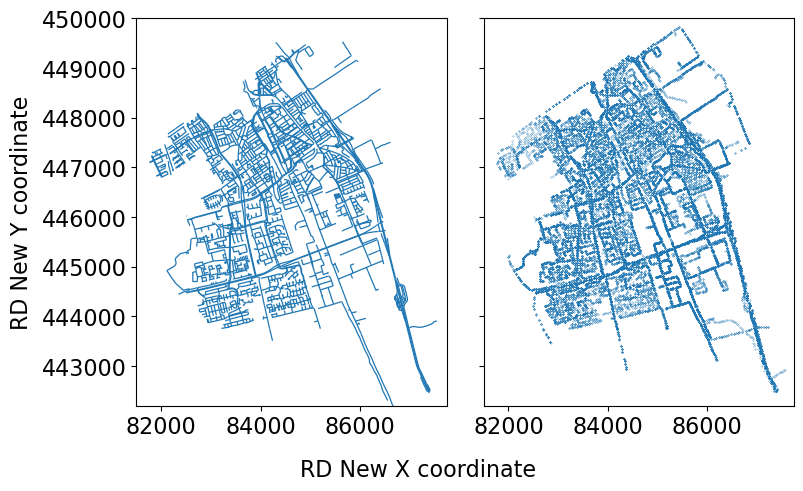

In [9]:
plot_data(network, panoids, save=True)

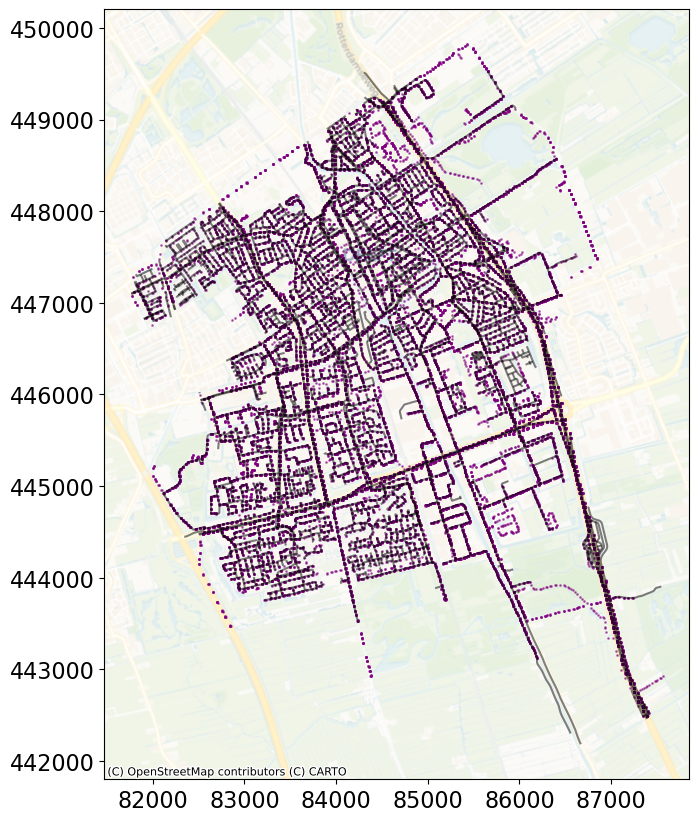

In [10]:
import contextily as ctx

fig, ax = plt.subplots(figsize=(10, 10))
network.plot(ax = ax, figsize=(10, 10), alpha=0.5, color = 'black')
panoids.plot(ax = ax, figsize=(10, 10), alpha=0.5, color = 'purple', markersize =1)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager, crs=network.crs, alpha=0.6)

#ax.set_axis_off()

plt.show()

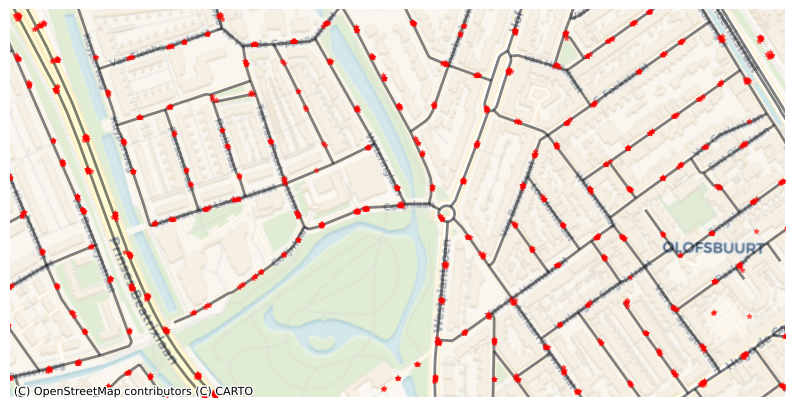

In [11]:
# Crop map in 7= 447000..448000

fig, ax = plt.subplots(figsize=(10, 10))
network.plot(ax = ax, figsize=(10, 10), alpha=0.5, color = 'black', lw = 2, zorder = 1)
panoids.plot(ax = ax, figsize=(10, 10), alpha=0.5, color = 'red', markersize = 12, zorder = 2, marker = '*')

ax.set_ylim(447200, 447700)
ax.set_xlim(83000, 84000)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager, crs=network.crs)

ax.set_axis_off()

plt.show()

In [12]:
network_panoids = match_panoids_to_sections(panoids, network, maximum_distance=20)

Matched 33589 out of 35856 panoids to network sections
Only network sections with assigned panoids will keep their entry in the assignment dictionary
1914 out of 3429 network sections have had panoids assigned


In [13]:
network_images = assign_images_to_sections(network_panoids, panoids, project_name)

Gathering all assigned images for which image features are present
Gathered all assigned images
Checking if missing images resulted in sections with panoid assignements but wihtout image assignments
0 section(s) with empty image assignments due to missing images, empty assignments will be deleted


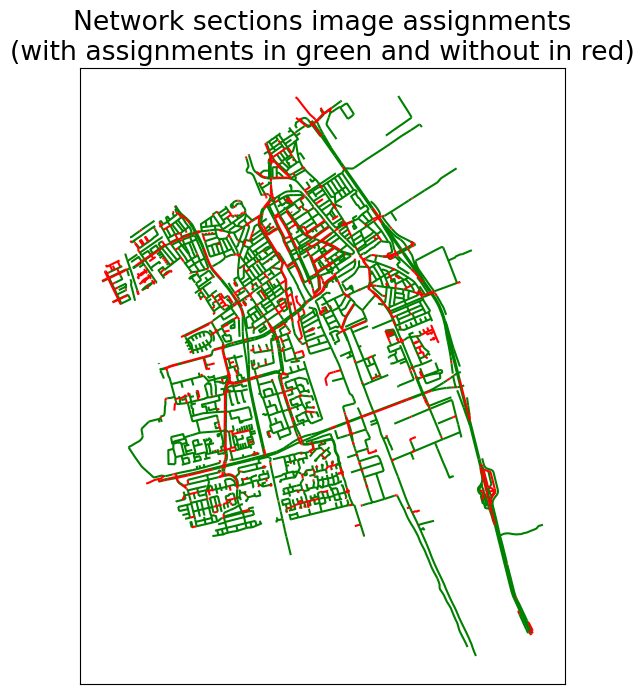

In [14]:
plot_image_assignments(network, network_images, save=True)

In [15]:
total = 0
for i in network_images:
    total += len(network_images[i])
print(f"Total number of images assigned to network: {total}")

Total number of images assigned to network: 68178


In [16]:
network['has_image'] = [1 if section_id in network_images else 0 for section_id in network['ID']]

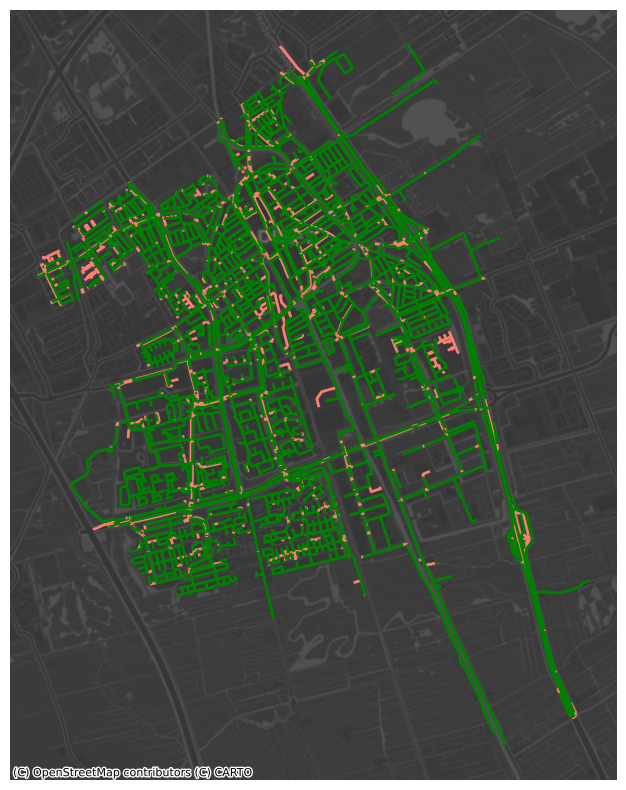

In [17]:
fig, ax = plt.subplots(figsize=(10, 10))
network.loc[network['has_image'] == 1].plot(ax = ax, figsize=(10, 10), alpha=1, color = 'green', zorder = 2, lw = 2)
network.loc[network['has_image'] == 0].plot(ax = ax, figsize=(10, 10), alpha=1, color = 'salmon', zorder = 1, lw = 2)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=network.crs, alpha=0.8)



ax.set_axis_off()

plt.show()

In [18]:
network

,id,geometry,ID,has_image
0,way/4419934,"LINESTRING (86038.238 446936.276, 86035.932 44...",way/4419934_0,1
1,way/7465870,"LINESTRING (86414.816 448580.661, 86312.258 44...",way/7465870_1,1
2,way/7467942,"LINESTRING (85108.245 448266.394, 85096.609 44...",way/7467942_2,1
3,way/7467944,"LINESTRING (85017.599 448258.764, 85002.975 44...",way/7467944_3,1
4,way/7467959,"LINESTRING (84913.271 448519.338, 84920.008 44...",way/7467959_4,1
...,...,...,...,...
3424,way/1308127712,"LINESTRING (83218.483 444344.224, 83214.25 444...",way/1308127712_3424,0
3425,way/1313198234,"LINESTRING (81968.181 446928.344, 82071.203 44...",way/1313198234_3425,1
3426,way/1317338885,"LINESTRING (84950.996 446978.078, 84965.357 44...",way/1317338885_3426,0
3427,way/1317376328,"LINESTRING (86484.179 447451.703, 86508.807 44...",way/1317376328_3427,1


In [19]:
# Percentage of sections with images
n_percent = network['has_image'].sum() / len(network) * 100

# Lenght percentage of sections with images
network['length'] = network['geometry'].length
network['length_has_image'] = network['length'] * network['has_image']
m_percent = network['length_has_image'].sum() / network['length'].sum() * 100

print(f"Percentage of sections with images: {n_percent:.2f}%")
print(f"Length percentage of sections with images: {m_percent:.2f}%")
print("number of sections with images:", network['has_image'].sum())
print("number of sections without images:", len(network) - network['has_image'].sum())
print("total number of sections:", len(network))

print("Total length of sections with images:", network['length_has_image'].sum())
print("Total length of sections without images:", network['length'].sum() - network['length_has_image'].sum())
print("Total length of sections:", network['length'].sum())

Percentage of sections with images: 55.82%
Length percentage of sections with images: 80.58%
number of sections with images: 1914
number of sections without images: 1515
total number of sections: 3429
Total length of sections with images: 251315.97591482912
Total length of sections without images: 60584.513827849994
Total length of sections: 311900.4897426791


In [20]:
print(f"Saving network image assignments to 'Intermediate Data\\{project_name}\\{network_name}_image_assignments.pkl'")
with open(f"Intermediate Data/{project_name}/{network_name}_image_assignments.pkl", 'wb') as f:
    pickle.dump(network_images, f)

network = network.to_crs('EPSG:4326')
network.to_file(f"Intermediate Data/{project_name}/{network_name}_network_prepped.geojson", index=False)

Saving network image assignments to 'Intermediate Data\Delft\OSM network_image_assignments.pkl'


## Step 4. Merge Feature Vectors

In [21]:
# Project settings used in this step
project_name = project_name
network_name = network_name

In [22]:
with open(rf"Intermediate Data/{project_name}/{network_name}_image_assignments.pkl", 'rb') as file:
    image_assignments = pickle.load(file)

In [23]:
network_vectors = create_section_vectors(image_assignments, project_name)

192 out of 1914 section feature vectors created
384 out of 1914 section feature vectors created
576 out of 1914 section feature vectors created
768 out of 1914 section feature vectors created
960 out of 1914 section feature vectors created
1152 out of 1914 section feature vectors created
1344 out of 1914 section feature vectors created
1536 out of 1914 section feature vectors created
1728 out of 1914 section feature vectors created
All 1914 section feature vectors created


In [24]:
with open(f"Intermediate Data/{project_name}/{network_name}_feature_vectors.pkl", 'wb') as file:
    pickle.dump(network_vectors, file)

## Step 5. Determine Clustering Size

In [25]:
# Project settings used in this step
project_name = project_name
network_name = network_name

variance_choice = 0.8

In [26]:
with open(rf"Intermediate Data/{project_name}/{network_name}_feature_vectors.pkl", 'rb') as file:
    network_feature_vectors = pickle.load(file)

df = pd.DataFrame(network_feature_vectors).T

_, network_vectors_array = create_feature_vector_array(network_feature_vectors)

In [27]:
# PCA Kmeans clustering iteration settings, defined here as they are used in later blocks of step 5
iterations = 8
variances = [0.8, 0.9, 0.95]
max_clusters = 25

In [28]:
network_vectors_array

array([[0.4414729 , 0.11492286, 0.34178957, ..., 0.41460532, 2.3582306 ,
        0.5409569 ],
       [0.06172911, 0.12374425, 0.40777153, ..., 0.25058043, 4.1088657 ,
        0.36958262],
       [0.04885237, 0.04970315, 0.8751077 , ..., 0.5139708 , 1.226962  ,
        0.01361168],
       ...,
       [0.750437  , 0.04490566, 0.32976508, ..., 0.2901527 , 1.5934565 ,
        0.5923569 ],
       [0.10764825, 0.14801992, 0.3140705 , ..., 1.0544842 , 0.9248223 ,
        1.6755275 ],
       [0.08124302, 0.02971135, 0.6291151 , ..., 0.28080785, 2.6214592 ,
        0.50843513]], dtype=float32)

In [29]:
iteration_results = iterate_pca_means(network_vectors_array, iterations, variances, max_clusters, random_state=0)

Starting pca kmeans iteration with 8 iterations, with 3 variances per iteration and 25 number of clusters per variance
Getting component list for given variances
	86 components for variance 0.8
	212 components for variance 0.9
	383 components for variance 0.95

Iteration 1
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 2
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 3
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 4
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 5
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 6
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 7
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95

Iteration 8
	Variance: 0.8
	Variance: 0.9
	Variance: 0.95


In [30]:
kmeans_array = iteration_results[0]
inertia_array = iteration_results[1]
silhoutte_array = iteration_results[2]
components_list = iteration_results[3]

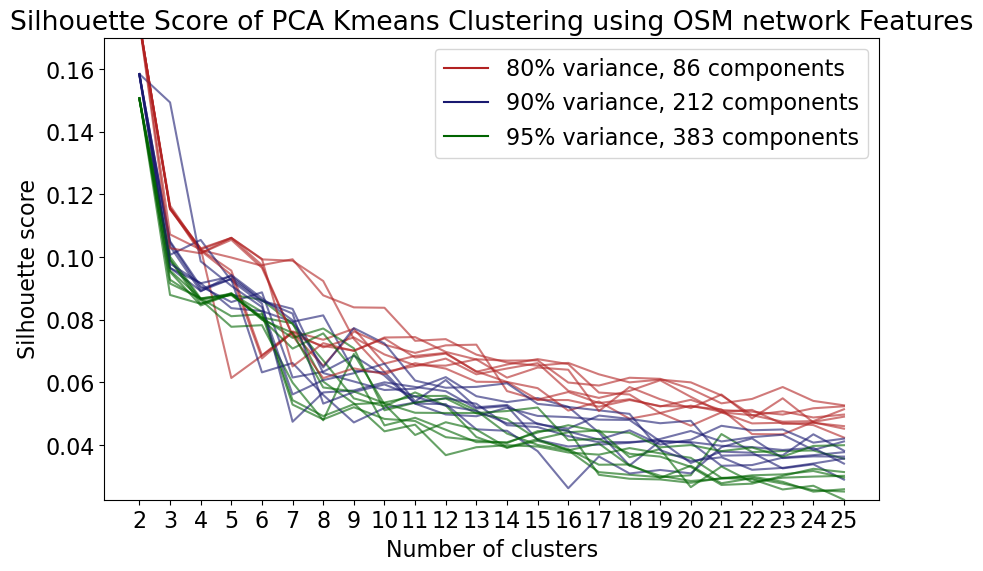

In [31]:
plot_silhouette(inertia_array, silhoutte_array, variances, components_list, max_clusters, network_name, save=True)

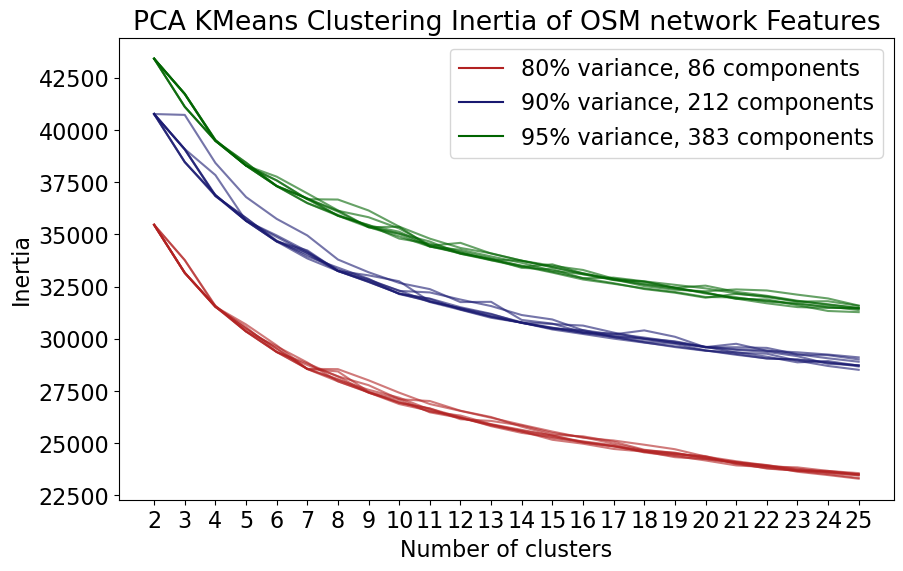

In [32]:
plot_inertia(inertia_array, variances, components_list, max_clusters, network_name, save=True)

Considering the elbow point, the optimal number of clusters is 5.38


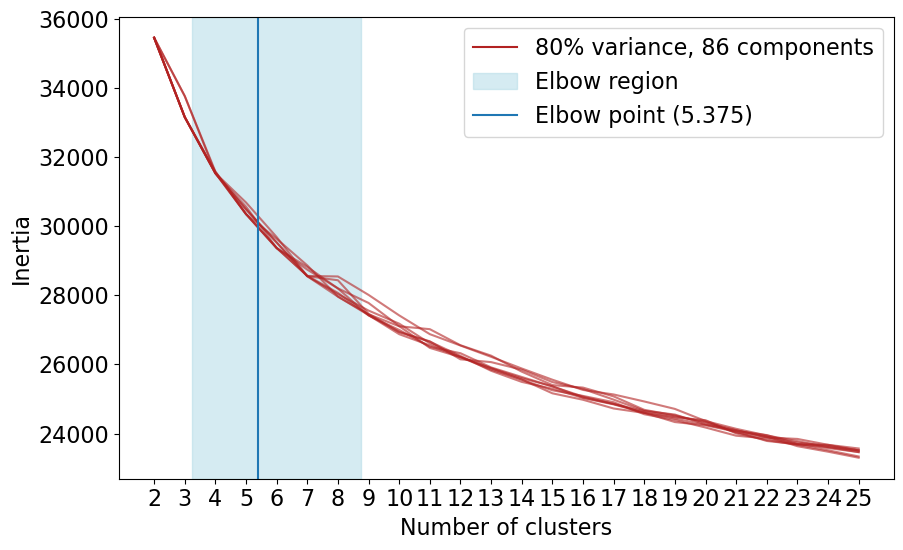

In [33]:
determine_elbow_point(inertia_array, variances.index(variance_choice), max_clusters, plot=True,
                      variances=variances, components_list=components_list, save=True)

## Step 6. Perform Clustering

In [34]:
# Project settings used in this step
project_name = project_name
network_name = network_name

number_of_clusters = number_of_clusters
number_of_components = 87

In [35]:
with open(rf"Intermediate Data/{project_name}/{network_name}_feature_vectors.pkl", 'rb') as file:
    network_feature_vectors = pickle.load(file)

network_ids, network_vectors_array = create_feature_vector_array(network_feature_vectors)

In [36]:
network_vectors_array.shape

(1914, 2048)

In [37]:
clustering_results, features_dim_reduced, linked = perform_clustering(network_vectors_array, network_ids, number_of_clusters,
                                                              number_of_components, random_state=3)

Scaled features to between 0 and 1
Reduced feature dimensions
Performed Kmeans clustering
Performed Hierarchical clustering
Performed Gaussian Mixture clustering
Clusterings completed, combined results


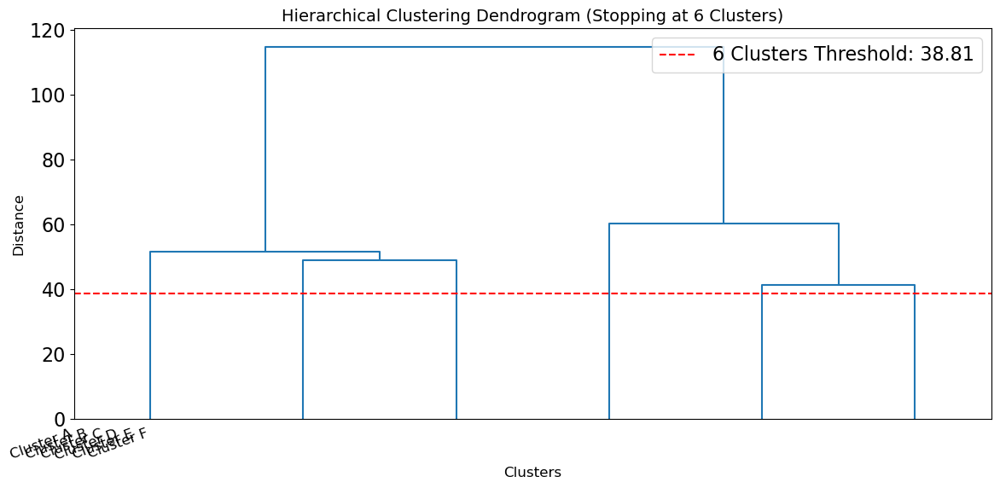

In [87]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Sample linkage matrix (replace with your actual 'linked' variable)
# linked = linkage(your_data, method='ward')

# Set the threshold for 6 clusters
max_d = linked[-6, 2] 

# Create the dendrogram
plt.figure(figsize=(12, 6))
dendro = dendrogram(
    linked,
    truncate_mode="lastp",  # Show only the last 6 clusters
    p=6,
    color_threshold=max_d
)

# Extract leaf node labels and clean them
leaf_labels = dendro["ivl"]  # Extract labels (string format)
clean_labels = [int(label.strip("()")) for label in leaf_labels]  # Convert to integer

# Map numeric labels to cluster names
new_labels = [cluster_names.get(label, str(label)) for label in clean_labels]

# Extract correct x-tick positions
x_positions = range(len(new_labels))  # Align ticks correctly

# Apply new labels to x-ticks
plt.xticks(ticks=x_positions, labels=new_labels, rotation=20, ha="right", fontsize=12)

# Add threshold line
plt.axhline(y=max_d, color='r', linestyle='--', label=f"6 Clusters Threshold: {max_d:.2f}")
plt.title("Hierarchical Clustering Dendrogram (Stopping at 6 Clusters)", fontsize=14)
plt.xlabel("Clusters", fontsize=12)
plt.ylabel("Distance", fontsize=12)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

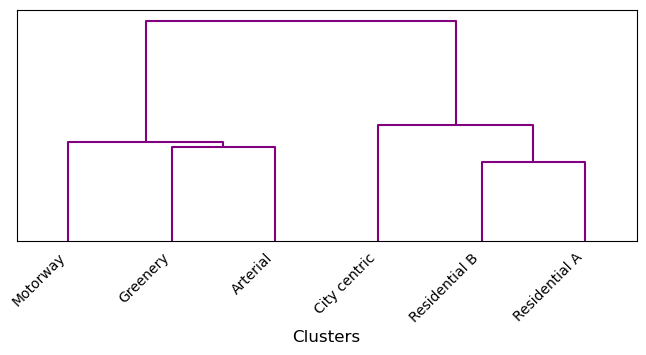

In [140]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

# Define max_d (threshold) based on the hierarchy
max_d = linked[-6, 2] 

# Define a function to label the truncated clusters
def label_func(id):
    d_values = {
        3804: "Motorway",
        3815: "Greenery",
        3818: "Arterial",
        3819: "City centric",
        3812: "Residential B",
        3821: "Residential A",
    }
    return d_values.get(id, "")

plt.figure(figsize=(8, 3))
dendrogram(
    linked,
    truncate_mode="lastp",  # Show only the last p clusters
    p=6,  # Number of clusters to show
    color_threshold=max_d,  # Color branches to reflect 6 clusters
    leaf_label_func=label_func,  # Use custom labels for clusters
    above_threshold_color='purple',
    orientation='top',
    leaf_font_size=10,
    show_leaf_counts=False,
    distance_sort='ascending',
    count_sort='ascending',
)

# Add threshold line
#plt.axhline(y=max_d, color='r', linestyle='--', label=f"6 Clusters Threshold: {max_d:.2f}")
plt.xlabel("Clusters", fontsize=12)
#plt.ylabel("Similarity Distance", fontsize=12)
#Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# add vertical grid lines for readability
plt.grid(axis='y')


# deactivating the y-axis ticks, but still showing horizontal grid lines
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().grid(axis='y')

plt.show()

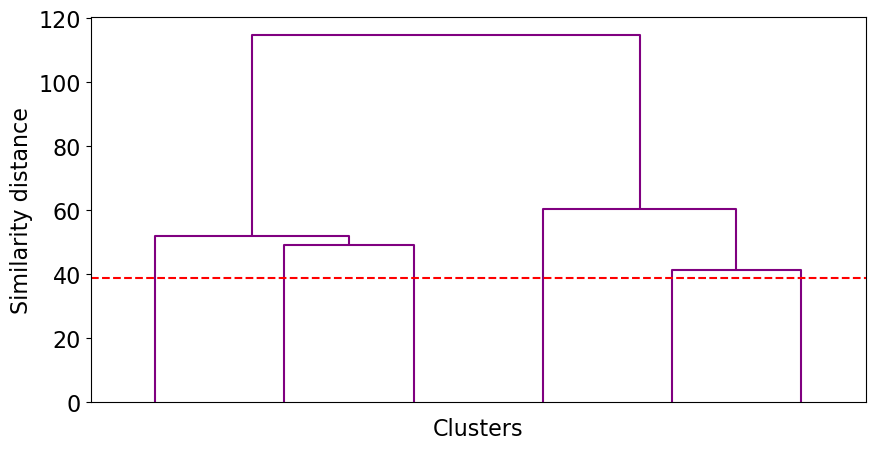

In [111]:


from scipy.cluster.hierarchy import linkage, dendrogram

max_d = linked[-6, 2] 


plt.figure(figsize=(10, 5))
dendrogram(
    linked,
    truncate_mode="lastp",  # Only show the last p clusters
    p=6,           # Show only up to 6 clusters
    color_threshold=max_d,  # Color branches to reflect 6 clusters
    labels = clustering_results['cluster_hr'],
    # Color of the dendrogram
    above_threshold_color='purple',
    orientation='top',
    leaf_font_size=10,
    show_leaf_counts=False,
    distance_sort='ascending',
    no_labels=False,
    count_sort='ascending',
)
plt.axhline(y=max_d, color='r', linestyle='--', label=f"6 Clusters Threshold: {max_d:.2f}")
plt.xlabel("Clusters")
plt.ylabel("Similarity distance")
#plt.legend()
plt.show()

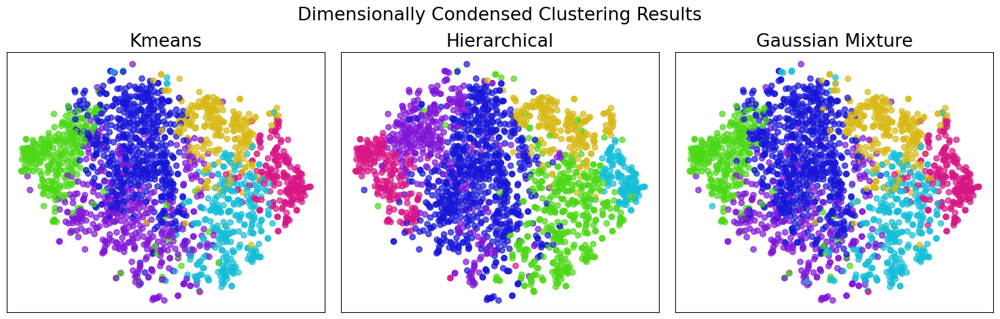

In [39]:
visualize_tsne(features_dim_reduced, clustering_results, random_state=1, save_stage='before', color_offset=0.05)

In [40]:
clustering_results

,section_id,cluster_km,cluster_hr,cluster_gm
0,way/4419934_0,5,0,3
1,way/7465870_1,2,4,2
2,way/7467942_2,4,4,4
3,way/7467944_3,0,0,0
4,way/7467959_4,3,0,3
...,...,...,...,...
1909,way/1289065266_3412,3,1,3
1910,way/1290494926_3413,4,4,4
1911,way/1304919905_3422,5,0,5
1912,way/1313198234_3425,5,5,5


In [41]:
clustering_results['cluster_hr'].value_counts()

cluster_hr
0    686
1    394
5    309
4    204
2    200
3    121
Name: count, dtype: int64

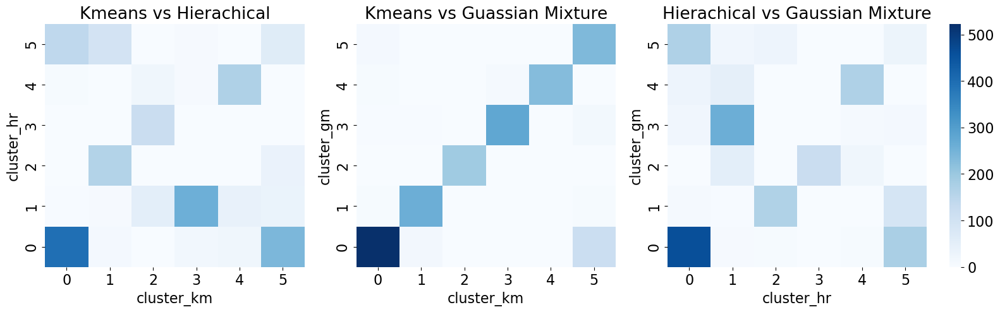

In [42]:
plot_heatmaps(clustering_results, cmap_name='Blues', save_stage='before')

In [ ]:
clustering_results, recluster_hr = renumber_clusters(clustering_results, 'cluster_km', 'cluster_hr', number_of_clusters)
print(f"Result hr to km renumbering: {recluster_hr}")
clustering_results, recluster_gm = renumber_clusters(clustering_results, 'cluster_km', 'cluster_gm', number_of_clusters)
print(f"Result gm to km renumbering: {recluster_gm}")

Result hr to km renumbering: {0: 0, 1: 3, 2: 1, 3: 2, 4: 4, 5: 5}
Result gm to km renumbering: {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5}


In [46]:
clustering_results['cluster_hr'].value_counts()

cluster_hr
0    686
3    394
5    309
4    204
1    200
2    121
Name: count, dtype: int64

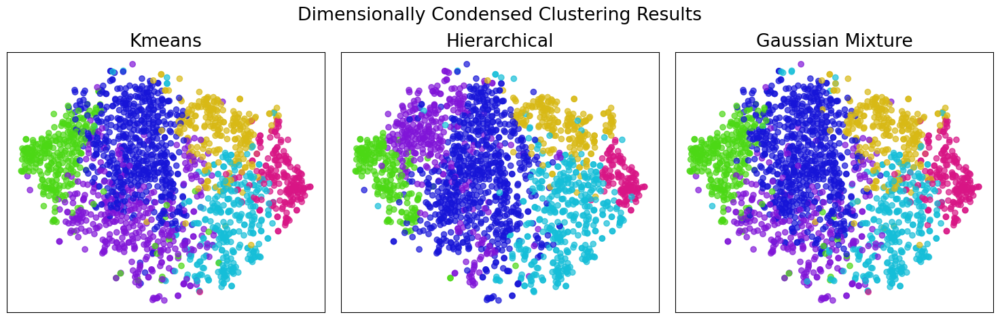

In [47]:
visualize_tsne(features_dim_reduced, clustering_results, random_state=1, save_stage='after', color_offset=0.05)

In [48]:
clustering_results

,section_id,cluster_km,cluster_hr,cluster_gm
0,way/4419934_0,5,0,3
1,way/7465870_1,2,4,2
2,way/7467942_2,4,4,4
3,way/7467944_3,0,0,0
4,way/7467959_4,3,0,3
...,...,...,...,...
1909,way/1289065266_3412,3,3,3
1910,way/1290494926_3413,4,4,4
1911,way/1304919905_3422,5,0,5
1912,way/1313198234_3425,5,5,5


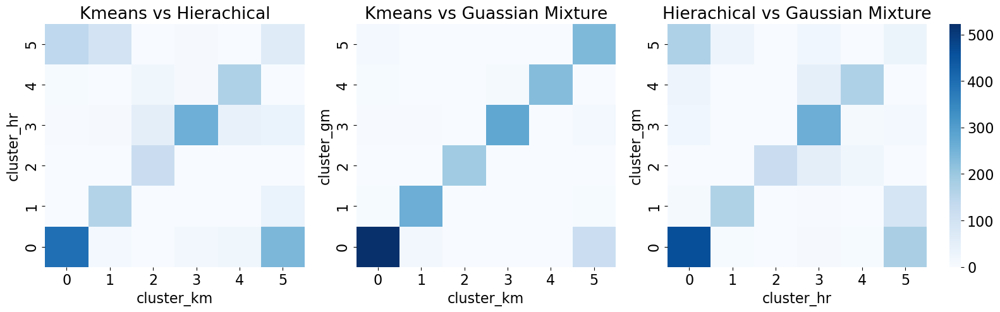

In [49]:
plot_heatmaps(clustering_results, cmap_name='Blues', save_stage='after')

In [50]:
clustering_results.to_csv(f"Intermediate Data/{project_name}/{network_name}_clustering_results.csv", index=False)

In [51]:
cluster_numbers = clustering_results.copy()
resnet_features = df.copy()
netwrok_geometries = network.copy()
resnet_features['section_id'] = resnet_features.index
resnet_features = resnet_features.reset_index(drop=True)
netwrok_geometries['section_id'] = netwrok_geometries['ID']

## Step 7. Name Clusters

In [52]:
# Project settings used in this step
project_name = project_name
network_name = network_name
project_images_folder = project_images_folder
number_of_clusters = number_of_clusters

random_color_state = 0.05

In [53]:
clustering_results = pd.read_csv(f"Intermediate Data/{project_name}/{network_name}_clustering_results.csv")

with open(f"Intermediate Data/{project_name}/{network_name}_image_assignments.pkl", 'rb') as file:
    image_assignments = pickle.load(file)

network = gpd.read_file(rf"Intermediate Data/{project_name}/{network_name}_network_prepped.geojson")

In [54]:
clustering_results.head(3)

,section_id,cluster_km,cluster_hr,cluster_gm
0,way/4419934_0,5,0,3
1,way/7465870_1,2,4,2
2,way/7467942_2,4,4,4


In [55]:
cluster_images = assign_images_to_clusters(clustering_results, number_of_clusters, image_assignments)
network_with_clusters = assign_clusters_to_geoms(network, clustering_results)

In [56]:
chart, colors = plot_all_methods_clustering(network_with_clusters, range(number_of_clusters),
                                            random_color_state=random_color_state, save_name='Results Numbered')
chart

alt.HConcatChart(...)

In [57]:
chart = plot_hierarchical_clustering(network_with_clusters, range(number_of_clusters), figure_type='cover',
                                     random_color_state=random_color_state, save_name='Cover')
chart = plot_hierarchical_clustering(network_with_clusters, range(number_of_clusters), figure_type='normal',
                                     random_color_state=random_color_state, save_name='Results Hierarchical Numbered')
chart

alt.LayerChart(...)

In [58]:
network_with_clusters.to_file(f"Intermediate Data/{project_name}/{network_name}_numbered_clusters.geojson")
with open(f"Intermediate Data/{project_name}/{network_name}_numbered_colors.pkl", 'wb') as f:
    pickle.dump(colors, f)

In [59]:
# sample_cluster_images(cluster_images, project_images_folder, 1, cluster_name=None, nrows=2, ncols=2)

In [81]:
# Creating a unified dataframe with all the data

cluster_numbers.head()

,section_id,cluster_km,cluster_hr,cluster_gm
0,way/4419934_0,5,0,3
1,way/7465870_1,2,4,2
2,way/7467942_2,4,4,4
3,way/7467944_3,0,0,0
4,way/7467959_4,3,0,3


In [82]:
resnet_features.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,section_id
0,0.441473,0.114923,0.341790,0.088877,0.280278,0.147367,0.479938,0.307468,0.939701,0.241099,...,0.446260,0.422932,0.192150,0.341521,0.797915,0.168864,0.414605,2.358231,0.540957,way/4419934_0
1,0.061729,0.123744,0.407772,0.131906,0.226736,0.073640,0.079467,0.301757,1.565933,0.348536,...,0.610851,0.763398,0.038022,0.043418,0.309969,0.310931,0.250580,4.108866,0.369583,way/7465870_1
2,0.048852,0.049703,0.875108,0.266235,0.283123,0.310185,0.346850,0.477722,0.659523,0.353169,...,0.597718,0.765076,0.035195,0.127607,0.315362,0.268052,0.513971,1.226962,0.013612,way/7467942_2
3,0.069339,0.064424,0.573808,0.090132,0.681263,0.437416,0.939685,0.231393,1.003111,0.279147,...,0.552300,0.157930,0.043940,0.346760,0.360828,0.226444,0.740861,2.247185,0.631968,way/7467944_3
4,0.484934,0.124438,0.407090,0.040558,0.383354,0.132053,0.217926,0.534027,1.078984,0.338410,...,0.356338,0.891829,0.131774,0.337321,0.801558,0.166243,0.498712,2.479494,0.103231,way/7467959_4


In [79]:
resnet_features['section_id'].value_counts()

section_id
way/4419934_0          1
way/147699432_1629     1
way/147699454_1641     1
way/147699453_1640     1
way/147699452_1639     1
                      ..
way/7542109_723        1
way/7542107_722        1
way/7542105_721        1
way/7542098_720        1
way/1317376328_3427    1
Name: count, Length: 1914, dtype: int64

In [84]:
netwrok_geometries.head()

,id,ID,has_image,length,length_has_image,geometry,section_id
0,way/4419934,way/4419934_0,1,259.342392,259.342392,"LINESTRING (4.38282 52.00651, 4.38278 52.00657...",way/4419934_0
1,way/7465870,way/7465870_1,1,517.224160,517.224160,"LINESTRING (4.38797 52.02133, 4.38649 52.02073...",way/7465870_1
2,way/7467942,way/7467942_2,1,60.973492,60.973492,"LINESTRING (4.369 52.01834, 4.36883 52.01851, ...",way/7467942_2
3,way/7467944,way/7467944_3,1,277.978511,277.978511,"LINESTRING (4.36768 52.01826, 4.36746 52.01846...",way/7467944_3
4,way/7467959,way/7467959_4,1,120.454027,120.454027,"LINESTRING (4.36611 52.02059, 4.36621 52.02069...",way/7467959_4


In [85]:
consolidated_data = pd.merge(netwrok_geometries, resnet_features, on='section_id', how='left')

In [87]:
consolidated_data = pd.merge(consolidated_data, cluster_numbers, on='section_id', how='left')

In [88]:
# 6 clusters random_state=3
cluster_names = {0: 'Residential A',
                 1: 'City centric',
                 2: 'Motorway',
                 3: 'Arterial',
                 4: 'Greenery',
                 5: 'Residential B'}

In [89]:
consolidated_data['label_km'] = consolidated_data['cluster_km'].map(cluster_names)
consolidated_data['label_hr'] = consolidated_data['cluster_hr'].map(cluster_names)
consolidated_data['label_gm'] = consolidated_data['cluster_gm'].map(cluster_names)

In [90]:
# Set it as a GeoDataFrame
consolidated_data = gpd.GeoDataFrame(consolidated_data, geometry='geometry')

In [95]:
cols = ['ID', 'has_image', 'length', 'cluster_km', 'cluster_hr', 'cluster_gm', 'label_km', 'label_hr', 'label_gm']
cols += [col for col in range(2048)]
cols += ['geometry']
consolidated_data[cols].head()

,ID,has_image,length,cluster_km,cluster_hr,cluster_gm,label_km,label_hr,label_gm,0,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,geometry
0,way/4419934_0,1,259.342392,5.0,0.0,3.0,Residential B,Residential A,Arterial,0.441473,...,0.446260,0.422932,0.192150,0.341521,0.797915,0.168864,0.414605,2.358231,0.540957,"LINESTRING (4.38282 52.00651, 4.38278 52.00657..."
1,way/7465870_1,1,517.224160,2.0,4.0,2.0,Motorway,Greenery,Motorway,0.061729,...,0.610851,0.763398,0.038022,0.043418,0.309969,0.310931,0.250580,4.108866,0.369583,"LINESTRING (4.38797 52.02133, 4.38649 52.02073..."
2,way/7467942_2,1,60.973492,4.0,4.0,4.0,Greenery,Greenery,Greenery,0.048852,...,0.597718,0.765076,0.035195,0.127607,0.315362,0.268052,0.513971,1.226962,0.013612,"LINESTRING (4.369 52.01834, 4.36883 52.01851, ..."
3,way/7467944_3,1,277.978511,0.0,0.0,0.0,Residential A,Residential A,Residential A,0.069339,...,0.552300,0.157930,0.043940,0.346760,0.360828,0.226444,0.740861,2.247185,0.631968,"LINESTRING (4.36768 52.01826, 4.36746 52.01846..."
4,way/7467959_4,1,120.454027,3.0,0.0,3.0,Arterial,Residential A,Arterial,0.484934,...,0.356338,0.891829,0.131774,0.337321,0.801558,0.166243,0.498712,2.479494,0.103231,"LINESTRING (4.36611 52.02059, 4.36621 52.02069..."


In [99]:
consolidated_data[cols].to_pickle(f"Intermediate Data/{project_name}/{network_name}_consolidated_data.pkl")

In [100]:
network_named_clusters = network_with_clusters.copy()
for cluster, cluster_name in cluster_names.items():
    network_named_clusters['cluster_km'] = network_named_clusters['cluster_km'].replace(cluster, cluster_name)
    network_named_clusters['cluster_hr'] = network_named_clusters['cluster_hr'].replace(cluster, cluster_name)
    network_named_clusters['cluster_gm'] = network_named_clusters['cluster_gm'].replace(cluster, cluster_name)

In [101]:
chart, colors = plot_all_methods_clustering(network_named_clusters, cluster_names.values(),
                                            random_color_state=random_color_state, save_name='Results Numbered')
chart

alt.HConcatChart(...)

In [102]:
clusters_code = network_named_clusters['cluster_hr'].unique().tolist()
print(clusters_code)

colors_code = ['#ffbbaa', # Suburban
          '#33FF57',  # Green areas
          '#3357FF',  # Arterial roads
          '#ff0000',  # Residential packed
          'grey',
          '#F3FF33',  # Highway
          '#33FFF6']  # Residential city center

#colors_code = ['#FF6F61',  # Bright Coral
#               '#5A9BD4',  # Light Blue
#               '#FFD700',  # Bright Gold
#               '#FF1493',  # Deep Pink
#               'grey',  # Dark Grey (for 'grey' in your original list)
#               '#32CD32',  # Lime Green
#               '#8A2BE2']  # Blue Violet


#colors = ['#984ea3','#4daf4a','#377eb8','#e41a1c','grey','#ffff33', '#ff7f00']
color_dict = dict(zip(clusters_code, colors_code))
network_named_clusters['cluster_color'] = network_named_clusters['cluster_hr'].map(color_dict)

['Residential A', 'Greenery', 'Arterial', 'Residential B', None, 'Motorway', 'City centric']


/opt/anaconda3/envs/tpm034a_mac/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


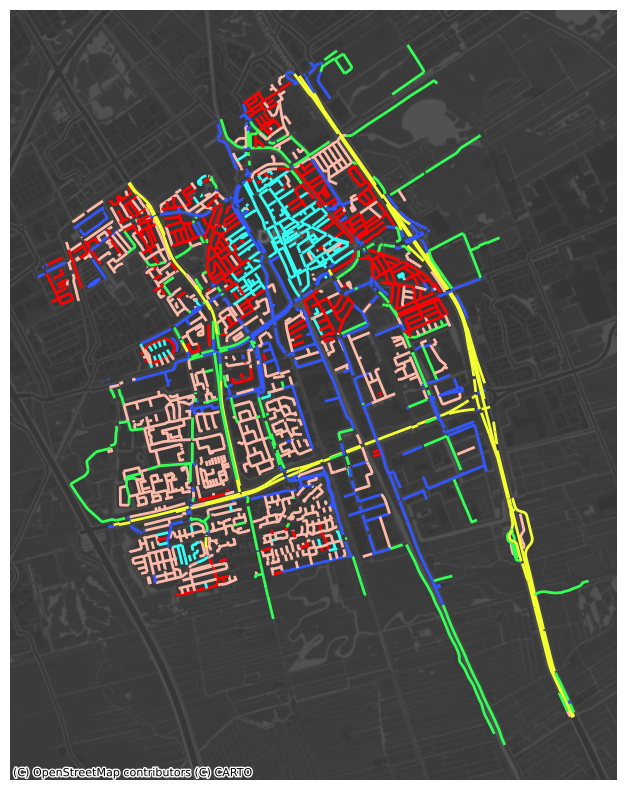

In [123]:
# plot the network linestring  using the colors indicated in cluster_color col 
fig, ax = plt.subplots(figsize=(10, 10))

#fig.patch.set_facecolor('black')  # Set figure background color to black
#ax.set_facecolor('black')   

# #0D1B2A
#fig.patch.set_facecolor('#0D1B2A')  # Set figure background color to black
#x.set_facecolor('#0D1B2A')  



net_plot = network_named_clusters.loc[network_named_clusters['cluster_color']!= 'grey']

net_plot.to_crs(28992, inplace=True)

net_plot.plot(ax = ax, figsize=(10, 10), alpha=1, color = net_plot['cluster_color'], zorder = 2, lw = 2)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=network.crs, alpha=0.8)




ax.set_axis_off()

plt.show()




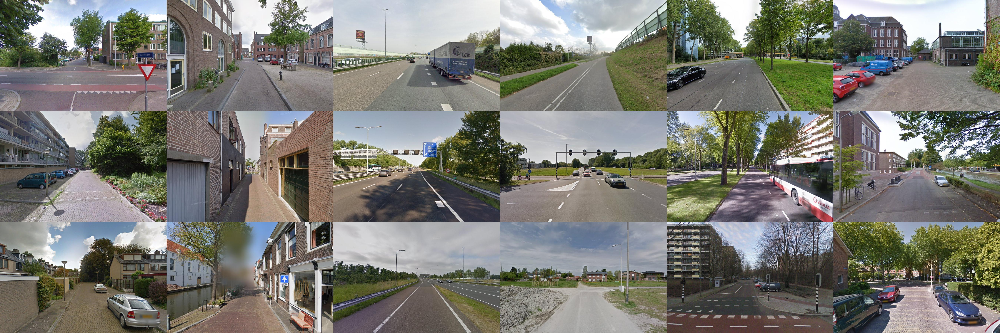

In [ ]:
# Matrix of images per cluster 
from numpy.random import choice
images_per_cluster = 3
sampled_images = {}
for cluster in cluster_names:
    sampled_images[cluster] = []

    way_ids = net_plot.loc[net_plot['cluster_hr'] == cluster_names[cluster]].sample(3)
    for way_id in way_ids['ID']:
        #chose 1 images from this list network_images[way_id]
        sampled_images[cluster].append(f"{project_images_folder}/{choice(network_images[way_id], 1)[0]}")

from PIL import Image as pilImage
from IPython.display import Image, display

def collage(images, output_path, cols=6, rows=3, width=900, height=600):
    thumbs = []
    for i in range(3):
        for imgs in images:
            thumbs.append(pilImage.open(images[imgs][i]).resize((width, height)))

    collage_image = pilImage.new('RGB', (cols*width, rows*height))
    for i in range(len(thumbs)):
        # Paste the image at the correct position (6 columns, 3 rows) fill it column by column
        collage_image.paste(thumbs[i], (i % cols * width, i // cols * height))
    collage_image.save(output_path)
    display(Image(output_path))

collage(sampled_images, f"sampled_images.jpg", cols=6, rows=3)

In [105]:
cluster_names = {0: 'Residential A',
                 1: 'Residential Inner City',
                 2: 'Motorway / Arterial',
                 3: 'Arterial / Collector',
                 4: 'Greenery / Collector',
                 5: 'Residential B'}

In [106]:
import altair as alt

domain_edges = cluster_names
range_colors = ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33']
color_export = {cluster: color for cluster, color in zip(domain_edges, range_colors)}




hierarch_edges = alt.Chart(prepped_network).mark_geoshape(
    filled=False,
    strokeWidth=2.5
).encode(
    tooltip=['ID:N', 'cluster_km:N', 'cluster_hr:N', 'cluster_gm:N'],
    color = alt.Color('cluster_hr:N', title="Clusters").scale(domain=domain_edges, range=range_colors)
).properties(
    width=400,
    height=550,
).project(
    'mercator'
)

chart = hierarch_edges.configure_legend(labelFontSize=10, titleFontSize=10)

chart


NameError: name 'prepped_network' is not defined

In [58]:
chart = plot_hierarchical_clustering(network_with_clusters, range(number_of_clusters), figure_type='normal',
                                     random_color_state=random_color_state, save_name='Results Hierarchical Numbered')
chart

alt.LayerChart(...)

In [107]:
network_named_clusters.to_file(f"Intermediate Data/{project_name}/{network_name}_named_clusters.geojson")
with open(f"Intermediate Data/{project_name}/{network_name}_named_colors.pkl", 'wb') as f:
    pickle.dump(colors, f)

## Step 8. Validation

In [108]:
project_name = project_name
network_name = network_name

In [109]:
network_named_clusters = gpd.read_file(f"Intermediate Data/{project_name}/{network_name}_named_clusters.geojson")
original_network = gpd.read_file(network_filepath)

with open(rf"Intermediate Data/{project_name}/{network_name}_named_colors.pkl", 'rb') as file:
    cluster_colors = pickle.load(file)

with open(rf"Intermediate Data/{project_name}/{network_name}_image_assignments.pkl", 'rb') as file:
    image_assignments = pickle.load(file)

network_named_clusters['surface'] = original_network['surface']
network_named_clusters['maxspeed'] = original_network['maxspeed']
network_named_clusters['highway'] = original_network['highway']

network = network_named_clusters.to_crs('EPSG:28992').copy()

Calculate the amount of picture per unit of lenght per cluster

/Users/francisco/Developer/DSAIE_STREETS/Scripts/step_8_validation.py:53: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


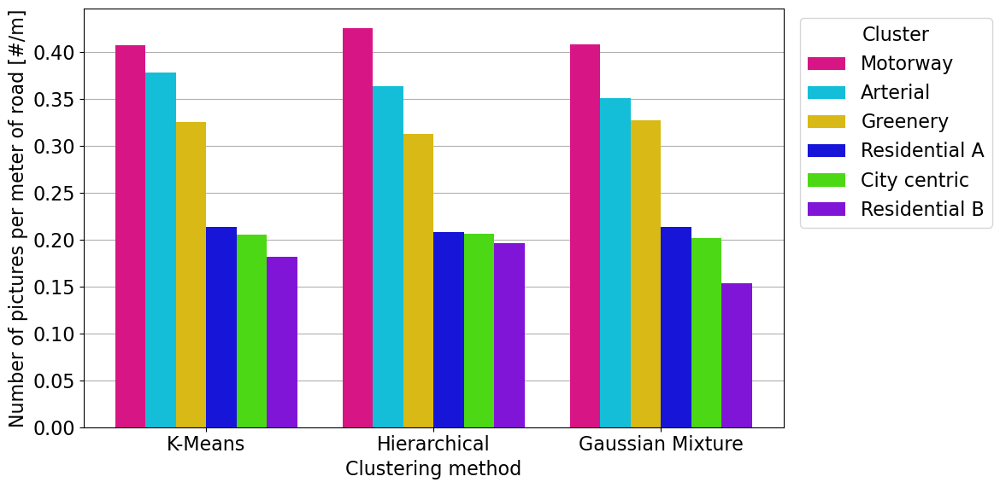

In [110]:
plot_amount_of_images_per_cluster(network, image_assignments, cluster_colors)

In [111]:
import rioxarray
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
from matplotlib import pyplot as plt
from geocube.vector import vectorize
plt.rcParams.update({'font.size': 16})

def plot_osm_road_types_comparison(which_set: str, network: gpd.GeoDataFrame) -> None:
    if which_set not in ['hierarchical', 'all']:
        raise ValueError("which_set can only be 'hierarchical' or 'all'")

    if which_set == 'hierarchical':
        clustering_cols = ['cluster_hr']
        width = 0.5

        clusters = ['City centric', 'Residential A', 'Residential B', 'Greenery',
                    'Arterial', 'Motorway']
        clusters = list(reversed(clusters))
        road_types = ['pedestrian', 'living_street', 'residential', 'tertiary', 'secondary', 'primary',
                    'trunk', 'motorway_link', 'motorway', 'service', 'unclassified']

        colors = plt.get_cmap("YlOrRd", 9)
        colors = colors(np.arange(0, 1, 1/(len(road_types)-2)))

        fig, axs = plt.subplots(1, 1, figsize=(6, 5))
        for ax, clustering_col in zip([axs], clustering_cols):
            data = {road_type: [0] * len(clusters) for road_type in road_types}
            for i, cluster in enumerate(clusters):
                matches = network[network[clustering_col] == cluster]
                total_length = sum(match['geometry'].length for _, match in matches.iterrows())

                for road_type in road_types:        
                    matches_2 = matches[matches['highway'] == str(road_type)]

                    if len(matches_2) != 0:
                        length = sum(match['geometry'].length for _, match in matches_2.iterrows())
                        data[road_type][i] = length / total_length

            # Plot bars
            bottom = np.zeros(len(clusters))
            for i, (road_type, values) in enumerate(data.items()):
                if i == 9:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color='#D3D3D3')
                elif i == 10:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color='#A9A9A9')
                else:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color=colors[i])
                bottom += values

                ax.legend(bbox_to_anchor=(1.109, 1.0), loc='upper left', title='Road type')
            ax.grid(which='major', axis='x', zorder=1)
            ax.set_ylabel('Cluster')
            ax.set_xlabel('Fraction')
            ax.set_xlim(0, 1)

        fig.tight_layout()
        fig.savefig("Images/Road Types Hierarchical.png", bbox_inches='tight', dpi=300)
        plt.show()

    else:  # which_set == 'all':
        clustering_cols = ['cluster_km', 'cluster_hr', 'cluster_gm']
        titles = ['K-Means', 'Hierarchical', 'Gaussian Mixture']
        width = 0.5

        clusters = ['Residential Inner City', 'Residential A', 'Residential B', 'Greenery / Collector',
                    'Arterial / Collector', 'Motorway / Arterial']
        clusters = list(reversed(clusters))
        road_types = ['pedestrian', 'living_street', 'residential', 'tertiary', 'secondary', 'primary',
                      'trunk', 'motorway_link', 'motorway', 'service', 'unclassified']

        colors = plt.get_cmap("YlOrRd", 9)
        colors = colors(np.arange(0, 1, 1/(len(road_types)-2)))

        fig, axs = plt.subplots(1, 3, figsize=(18, 5))
        for ax, clustering_col, title in zip(axs, clustering_cols, titles):
            data = {road_type: [0] * len(clusters) for road_type in road_types}
            for i, cluster in enumerate(clusters):
                matches = network[network[clustering_col] == cluster]
                total_length = sum(match['geometry'].length for _, match in matches.iterrows())

                for road_type in road_types:        
                    matches_2 = matches[matches['highway'] == str(road_type)]

                    if len(matches_2) != 0:
                        length = sum(match['geometry'].length for _, match in matches_2.iterrows())
                        data[road_type][i] = length / total_length

            # Plot bars
            bottom = np.zeros(len(clusters))
            for i, (road_type, values) in enumerate(data.items()):
                if i == 9:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color='#D3D3D3')
                elif i == 10:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color='#A9A9A9')
                else:
                    p = ax.barh(clusters, values, width, label=road_type, left=bottom, zorder=2, color=colors[i])
                bottom += values

            if ax == axs[-1]:
                ax.legend(bbox_to_anchor=(1.01, 1.0), loc='upper left', title='Road type')
            if ax == axs[1]:
                ax.set_xlabel('Fraction')
            if ax == axs[0]:
                ax.set_ylabel('Cluster')
            if ax != axs[0]:
                ax.set_yticklabels([])
            ax.grid(which='major', axis='x', zorder=1)

            ax.set_xlim(0, 1)
            ax.set_title(title)

        fig.tight_layout()
        fig.savefig("Images/Road Types.png", bbox_inches='tight', dpi=300)
        plt.show()

In [115]:
network.to_file(f"Intermediate Data/{project_name}/{network_name}_network_data_for_francisco.geojson")

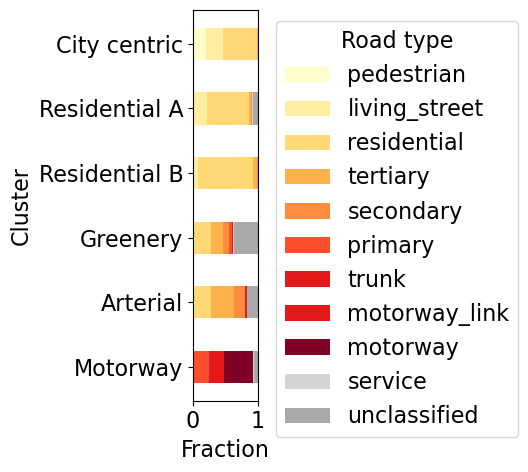

In [112]:
plot_osm_road_types_comparison('hierarchical', network)

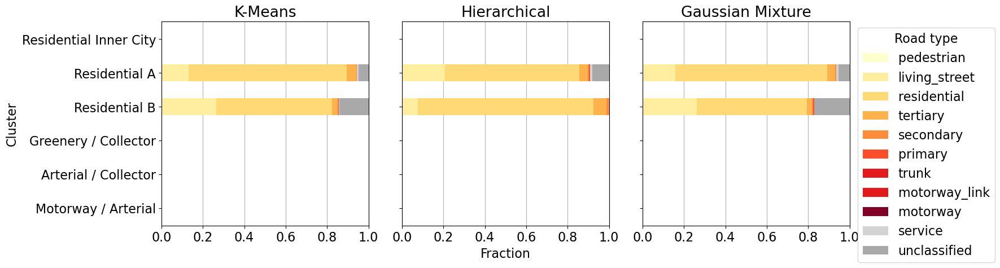

In [73]:
plot_osm_road_types_comparison('all', network)

In [59]:
network['surface'] = network['surface'].apply(lambda x: x if x in ['paving_stones', 'asphalt'] else 'other')

In [60]:
import numpy as np

In [61]:
def plot_osm_surface_type_comparison(which_set: str, network: gpd.GeoDataFrame) -> None:
    if which_set not in ['hierarchical', 'all']:
        raise ValueError("which_set can only be 'hierarchical' or 'all'")
    
    if which_set == 'hierarchical':
        clustering_cols = ['cluster_hr']
        width = 0.5

        clusters = list(network['cluster_km'].unique())
        clusters.remove(None)
        surfaces = ['asphalt', 'paving_stones', 'other']
        other_surfaces = list(network['surface'].unique())
        other_surfaces.remove('asphalt')
        other_surfaces.remove('paving_stones')

        fig, axs = plt.subplots(1, 1, figsize=(6, 5))
        for ax, clustering_col in zip([axs], clustering_cols):
            data = {speed: [0] * len(clusters) for speed in surfaces}
            for i, cluster in enumerate(clusters):
                matches = network[network[clustering_col] == cluster]
                total_length = sum(match['geometry'].length for _, match in matches.iterrows())

                for surface in surfaces:
                    if surface == 'other':
                        matches_2 = matches[matches['surface'].isin(other_surfaces)]
                    else:
                        matches_2 = matches[matches['surface'] == str(surface)]

                    if len(matches_2) != 0:
                        length = sum(match['geometry'].length for _, match in matches_2.iterrows())
                        data[surface][i] = length / total_length

            # Sort by share of asphalt per cluster from the kmeans clustering ascending
            sort_by = data['asphalt']
            clusters_sorted = [x for _, x in sorted(zip(data['asphalt'],clusters), reverse=True)]

            data_sorted = data.copy()
            for surface, values in data.items():
                data_sorted[surface] = [x for _, x in sorted(zip(sort_by,values), reverse=True)]

            # Plot bars asphalt _> graphit, paving_stones -> dark orange like, other ->
            colors = {'asphalt': '#575757', 'paving_stones': '#e94520', 'other': 'lightgrey'}
            bottom = np.zeros(len(clusters_sorted))
            for surface, values in data_sorted.items():
                if surface == 'other':
                    p = ax.barh(clusters_sorted, values, width, label=surface, left=bottom, zorder=2, color='#b8e1ff', hatch =  "/")
                else:
                    p = ax.barh(clusters_sorted, values, width, label=surface, left=bottom, zorder=2, color = colors[surface])
                bottom += values


            ax.legend(bbox_to_anchor=(1.15, 1.0), loc='upper left', title='Surface type')
            ax.grid(which='major', axis='x', zorder=1)
            ax.set_ylabel('Cluster')
            ax.set_xlabel('Fraction')
            ax.set_xlim(0, 1)

        fig.tight_layout()
        fig.savefig("Images/Surface Types Hierarchical.png", bbox_inches='tight', dpi=300)
        plt.show()

    else:  # which_set == 'all':
        clustering_cols = ['cluster_km', 'cluster_hr', 'cluster_gm']
        titles = ['K-Means', 'Hierarchical', 'Gaussian Mixture']
        width = 0.5

        clusters = list(network['cluster_km'].unique())
        clusters.remove(None)
        surfaces = ['asphalt', 'paving_stones', 'other']
        other_surfaces = list(network['surface'].unique())
        other_surfaces.remove(None)
        other_surfaces.remove('asphalt')
        other_surfaces.remove('paving_stones')

        fig, axs = plt.subplots(1, 3, figsize=(18, 5))
        for ax, clustering_col, title in zip(axs, clustering_cols, titles):
            data = {speed: [0] * len(clusters) for speed in surfaces}
            for i, cluster in enumerate(clusters):
                matches = network[network[clustering_col] == cluster]
                total_length = sum(match['geometry'].length for _, match in matches.iterrows())

                for surface in surfaces:        
                    if surface == 'other':
                        matches_2 = matches[matches['surface'].isin(other_surfaces)]
                    else:
                        matches_2 = matches[matches['surface'] == str(surface)]

                    if len(matches_2) != 0:
                        length = sum(match['geometry'].length for _, match in matches_2.iterrows())
                        data[surface][i] = length / total_length

            # Sort by share of asphalt per cluster from the kmeans clustering ascending
            if ax == axs[0]:
                sort_by = data['asphalt']
                clusters_sorted = [x for _, x in sorted(zip(data['asphalt'],clusters), reverse=True)]

            data_sorted = data.copy()
            for surface, values in data.items():
                data_sorted[surface] = [x for _, x in sorted(zip(sort_by,values), reverse=True)]

            # Plot bars
            bottom = np.zeros(len(clusters_sorted))
            for surface, values in data_sorted.items():
                if surface == 'other':
                    p = ax.barh(clusters_sorted, values, width, label=surface, left=bottom, zorder=2, color='green')
                else:
                    p = ax.barh(clusters_sorted, values, width, label=surface, left=bottom, zorder=2, color = 'red')
                bottom += values

            if ax == axs[-1]:
                ax.legend(bbox_to_anchor=(1.01, 1.0), loc='upper left', title='Surface type')
            if ax == axs[1]:
                ax.set_xlabel('Fraction')
            if ax == axs[0]:
                ax.set_ylabel('Cluster')
            if ax != axs[0]:
                ax.set_yticklabels([])
            ax.grid(which='major', axis='x', zorder=1)
            ax.set_xlim(0, 1)
            ax.set_title(title)

        fig.tight_layout()
        fig.savefig("Images/Surface Types.png", bbox_inches='tight', dpi=300)
        plt.show()

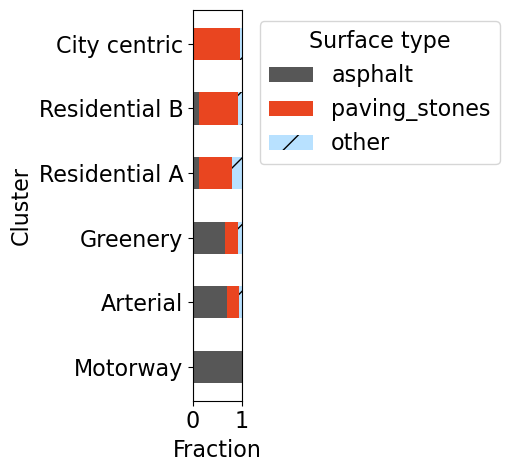

In [62]:
plot_osm_surface_type_comparison('hierarchical', network)

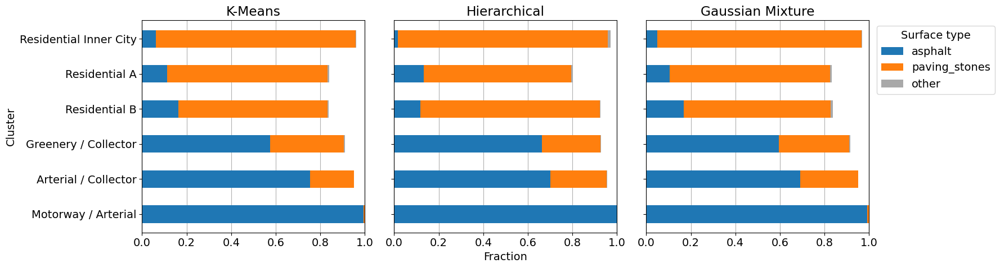

In [213]:
plot_osm_surface_type_comparison('all', network)

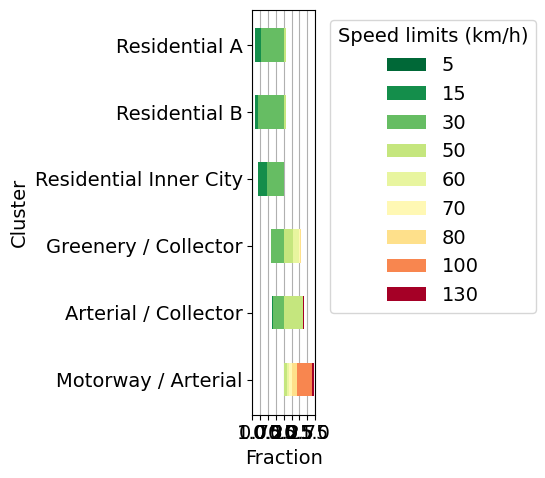

In [214]:
plot_osm_speed_limits_comparison('hierarchical', network)

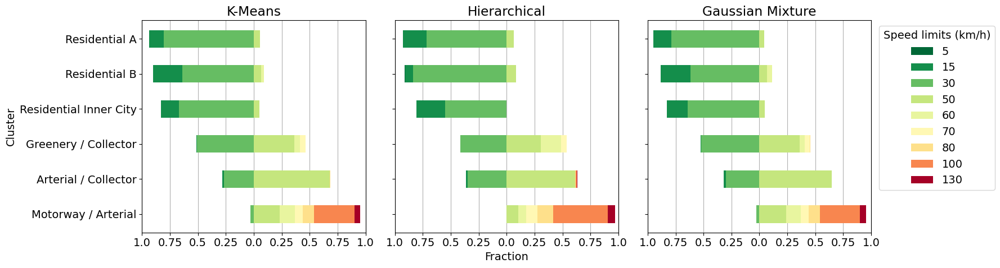

In [215]:
plot_osm_speed_limits_comparison('all', network)

In [118]:
def open_groen_data(groen_file: str, network: gpd.GeoDataFrame, plot: bool=True):
    data = rioxarray.open_rasterio(r'Groen/rivm_20231221_groenkaart_10m_2022.tif')
    data.name = "myData"
    # gdf = vectorize(data)

    bounds = network.total_bounds

    data = data.rio.clip_box(*bounds)
    data.data[data.data == -9999] = 0

    if plot:
        fig, ax = plt.subplots()
        plt.rcParams.update({'font.size': 12})
        data.plot(ax=ax, cbar_kwargs={'label': "Normalized Green Value"})
        ax.set_title('')
        ax.set_xlabel('RD New X coordinate')
        ax.set_ylabel('RD New Y coordinate')
        fig.savefig("Images/Greenery Heatmap.png", bbox_inches='tight', dpi=300)
        ax.set_title("Greenness of Delft from Dutch 'Groenkaart'")
        fig.show()
    
    return data

/var/folders/3y/_slxmlxx5jbf7rshtmvn2dgr0000gq/T/ipykernel_34451/1231157171.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


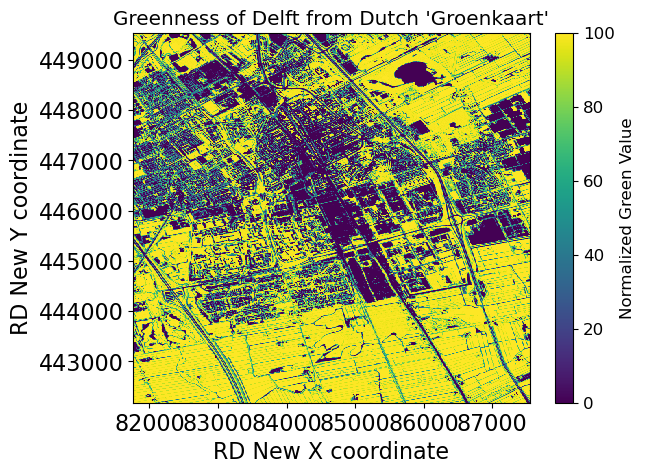

In [119]:
groen_data = open_groen_data(r'Groen/rivm_20231221_groenkaart_10m_2022.tif', network, plot=True)

In [120]:
network_with_groen = assign_groen_data_to_network(network, groen_data) 

In [122]:
network_with_groen.to_file(f"Intermediate Data/{project_name}/{network_name}_network_data_for_francisco2.geojson")

In [204]:
def plot_groen_data_comparison(which_set: str, network: gpd.GeoDataFrame, cluster_colors: dict[str, str]) -> None:
    if which_set not in ['hierarchical', 'all']:
        raise ValueError("which_set can only be 'hierarchical' or 'all'")
    
    if which_set == 'hierarchical':
        fig, axs = plt.subplots(1, 1, sharey=True, figsize=(5, 6))
        plt.rcParams.update({'font.size': 14})
        clustering_cols = ['cluster_hr']

        network_hr = network[pd.notna(network['cluster_hr'])]
        grouped = network_hr.loc[:,['cluster_hr', 'green']] \
                                .groupby(['cluster_hr']) \
                                .median() \
                                .sort_values(by='green', ascending=False)

        for ax, clustering_col in zip([axs], clustering_cols):
            network_i = network[pd.notna(network[clustering_col])]

            #sns.boxplot(x=network_i[clustering_col], y=network_i['green'], ax=ax,
            #            order=grouped.index, width=0.67, linewidth=1.1, notch=True,
            #            palette=cluster_colors, medianprops=dict(color="red"))
            
            sns.violinplot(x=network_i[clustering_col], y=network_i['green'], ax=ax,
               order=grouped.index, width=0.67, linewidth=1.1,
               palette=cluster_colors)

            ax.set_xlabel('')
            ax.set_xlabel('Cluster')
            ax.set_ylabel('Normalized green value')
            ax.set_xticks(ax.get_xticks())
            ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
            ax.grid(axis='y')

        plt.tight_layout()
        fig.savefig("Images/Greenery Boxplot Hierarchical.png", bbox_inches='tight', dpi=300)
        plt.show()

KeyError: "['green'] not in index"

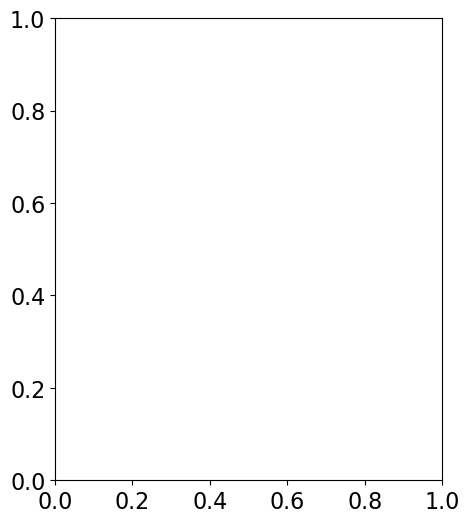

In [205]:
plot_groen_data_comparison('hierarchical', network, cluster_colors)

c:\Users\lange\OneDrive\Documenten\Jaar_5-Msc_CE_TTE\DSAIE_STREETS\Scripts\step_8_validation.py:517: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=network_i[clustering_col], y=network_i['green'], ax=ax, order=grouped.index, width=0.67, linewidth=1.1, notch=True,
c:\Users\lange\OneDrive\Documenten\Jaar_5-Msc_CE_TTE\DSAIE_STREETS\Scripts\step_8_validation.py:517: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=network_i[clustering_col], y=network_i['green'], ax=ax, order=grouped.index, width=0.67, linewidth=1.1, notch=True,
c:\Users\lange\OneDrive\Documenten\Jaar_5-Msc_CE_TTE\DSAIE_STREETS\Scripts\step_8_validation.py:517: FutureWarning: 

Passing `palette` without assigning `hue` is depre

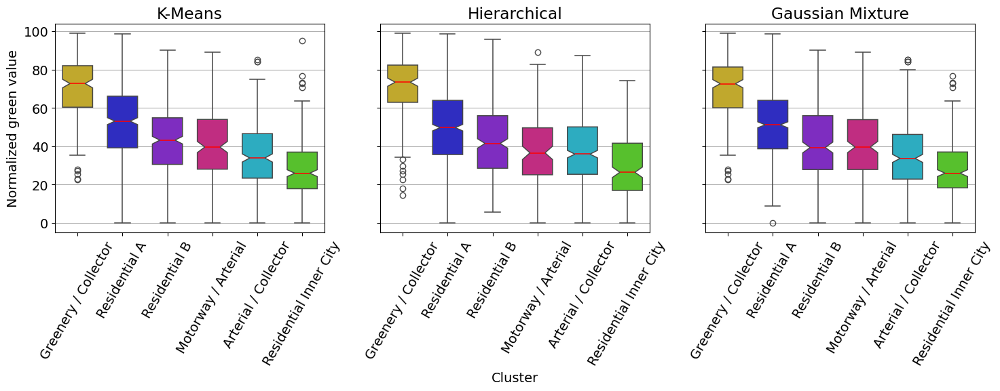

In [18]:
plot_groen_data_comparison('all', network, cluster_colors)